# Prepare embeddings

In [20]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]=""

In [21]:
import torch
from fastai.vision import *
from fastai.widgets import DatasetFormatter
from fastai.callbacks.hooks import hook_output
from pathlib import Path
from sklearn.neighbors import KNeighborsClassifier
from scipy.spatial.distance import cosine
import time

In [22]:
dataset_root = Path('/home/mauto/data/LincParse/eval_lions_zoom')
model_root = Path('/home/mauto/data/LincParse/cv_dataset_zoom')

In [23]:
def get_embeddings(learn, fix_dl,**kwargs):
    hook = hook_output(list(learn.model.modules())[-3])

    actns = DatasetFormatter.get_actns(learn, hook=hook, dl=fix_dl, **kwargs)

    return actns

In [26]:
disk_data = (ImageList.from_folder(model_root)
    .split_by_folder()          
    .label_from_folder()
    .transform(None, size=224)
    .databunch()
    .normalize(imagenet_stats))

In [27]:
disk_data.train_ds.classes

['100',
 '101',
 '102',
 '103',
 '115',
 '116',
 '117',
 '120',
 '121',
 '122',
 '123',
 '124',
 '125',
 '127',
 '131',
 '133',
 '139',
 '140',
 '141',
 '142',
 '143',
 '147',
 '15',
 '155',
 '158',
 '159',
 '16',
 '167',
 '17',
 '173',
 '183',
 '184',
 '185',
 '189',
 '19',
 '196',
 '197',
 '198',
 '199',
 '203',
 '204',
 '205',
 '206',
 '21',
 '212',
 '237',
 '238',
 '239',
 '241',
 '242',
 '243',
 '244',
 '245',
 '247',
 '248',
 '249',
 '250',
 '260',
 '261',
 '268',
 '269',
 '27',
 '270',
 '271',
 '284',
 '285',
 '29',
 '297',
 '298',
 '299',
 '30',
 '300',
 '31',
 '311',
 '32',
 '320',
 '321',
 '322',
 '33',
 '330',
 '334',
 '34',
 '35',
 '351',
 '352',
 '353',
 '354',
 '355',
 '356',
 '36',
 '366',
 '37',
 '372',
 '373',
 '374',
 '375',
 '376',
 '377',
 '378',
 '379',
 '38',
 '39',
 '40',
 '401',
 '403',
 '404',
 '407',
 '409',
 '41',
 '415',
 '416',
 '419',
 '42',
 '420',
 '429',
 '431',
 '432',
 '433',
 '434',
 '436',
 '437',
 '439',
 '44',
 '440',
 '442',
 '451',
 '452',
 '455

In [6]:
learn = load_learner(model_root,'face_id_model.pkl')

In [7]:
fix_dl = disk_data.train_dl.new(shuffle=False, drop_last=False)

In [8]:
start_time = time.time()
embeddings = get_embeddings(learn, fix_dl, pool=None)
print("--- %s seconds ---" % (time.time() - start_time))

Getting activations...


--- 5.508121728897095 seconds ---


In [ ]:
torch.save(embeddings, '/home/mauto/data/LincParse/cv_dataset_zoom/t_embeddings.pt')
torch.save(disk_data.train_ds.y.items, '/home/mauto/data/LincParse/cv_dataset_zoom/t_labels.pt')

In [10]:
disk_embeddings = torch.load('/home/mauto/data/LincParse/cv_dataset_zoom/t_embeddings.pt')
disk_labels = torch.load('/home/mauto/data/LincParse/cv_dataset_zoom/t_labels.pt')

# Get Evaluation Score with 20 lions database

In [9]:
fix_dl = disk_data.valid_dl.new(shuffle=False, drop_last=False)

In [10]:
start_time = time.time()
inc_embeddings = get_embeddings(learn, fix_dl, pool=None)
print("--- %s seconds ---" % (time.time() - start_time))

Getting activations...


--- 2.189838409423828 seconds ---


In [11]:
def get_neighbors(neighbors,k):
    k_neighbors = []
    for neighbor in neighbors:
        if neighbor not in k_neighbors:
            k_neighbors.append(neighbor)
        if len(k_neighbors)>=k:
            break
    return k_neighbors

def identification_score(emb_gal, label_gal, emb_probes, label_probes):
    knn_classifier_l2 = KNeighborsClassifier(n_neighbors=5, n_jobs=-1)
    knn_classifier_cosine = KNeighborsClassifier(n_neighbors=5, metric=cosine, n_jobs=-1)

    knn_classifier_l2.fit(emb_gal, label_gal)
    knn_classifier_cosine.fit(emb_gal, label_gal)

    top1_acc_l2 = knn_classifier_l2.score(emb_probes, label_probes)
    top1_acc_cos = knn_classifier_cosine.score(emb_probes, label_probes)

    l2_neighbors = knn_classifier_l2.kneighbors(emb_probes, n_neighbors=50, return_distance=False)
    cos_neighbors = knn_classifier_cosine.kneighbors(
        emb_probes, n_neighbors=50, return_distance=False
    )
    
    top5_acc_l2 = 0
    top5_acc_cos = 0

    for i in range(len(l2_neighbors)):
        top5_l2 = get_neighbors(l2_neighbors[i],5)
        top5_cos = get_neighbors(cos_neighbors[i],5)
        top5_acc_l2 += 1 if label_probes[i] in label_gal[top5_l2] else 0
        top5_acc_cos += 1 if label_probes[i] in label_gal[top5_cos] else 0

    top5_acc_l2 = top5_acc_l2 / len(l2_neighbors)
    top5_acc_cos = top5_acc_cos / len(l2_neighbors)

    return top1_acc_l2, top5_acc_l2, top1_acc_cos, top5_acc_cos

In [12]:
identification_score(embeddings, disk_data.train_ds.y.items, inc_embeddings, disk_data.valid_ds.y.items)

(0.775, 0.925, 0.775, 0.925)

## Get Evaluation Score with all lions on the database

In [16]:
start_time = time.time()
identification_score(embeddings, disk_data.train_ds.y.items, inc_embeddings, disk_data.valid_ds.y.items)
print("--- %s seconds ---" % (time.time() - start_time))

--- 12.37735629081726 seconds ---


In [17]:
len(embeddings)

3917

In [18]:
len(inc_embeddings)

40

In [11]:
identification_score(embeddings, disk_data.train_ds.y.items, inc_embeddings, disk_data.valid_ds.y.items)

(0.675, 0.85, 0.575, 0.825)

In [13]:
from torchvision import transforms

def plot_most_similar(img_probes, emb_probes, label_probes, img_gal, emb_gal, label_gal, k):
    knn_classifier_l2 = KNeighborsClassifier(n_neighbors=5, n_jobs=-1)
    knn_classifier_cosine = KNeighborsClassifier(n_neighbors=5, metric=cosine, n_jobs=-1)

    knn_classifier_l2.fit(emb_gal, label_gal)
    knn_classifier_cosine.fit(emb_gal, label_gal)

    l2_neighbors = knn_classifier_l2.kneighbors(emb_probes, n_neighbors=k, return_distance=False)
    cos_neighbors = knn_classifier_cosine.kneighbors(
        emb_probes, n_neighbors=k, return_distance=False
    )

    for i,img_probe in enumerate(img_probes):
        fig, ax = plt.subplots(ncols=k + 1, figsize=[15, (k + 1) * 15])
        ax[0].imshow(transforms.ToPILImage()(img_probe.data))
        ax[0].title.set_text('Original - {}'.format(label_probes[i]))
        for j, img in enumerate(img_gal[l2_neighbors[i]]):
            ax[j + 1].imshow(transforms.ToPILImage()(img.data))
            if label_probes[i] == label_gal[l2_neighbors[i]][j]:
                ax[j + 1].title.set_text('Correct - {}'.format(label_gal[l2_neighbors[i]][j]))
            else:
                ax[j + 1].title.set_text('Wrong - {}'.format(label_gal[l2_neighbors[i]][j]))
        plt.tight_layout()
        plt.show()
        plt.close(fig)

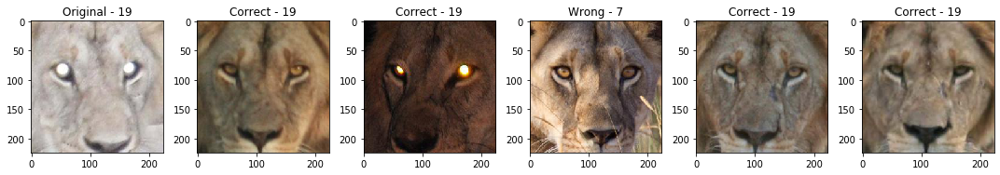

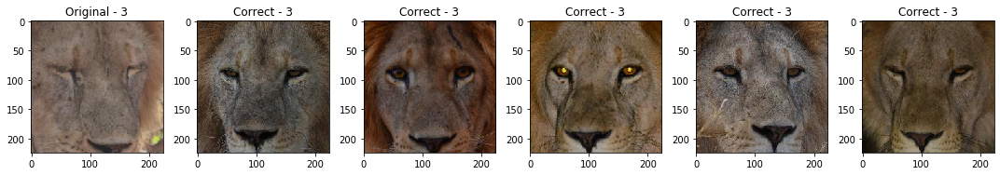

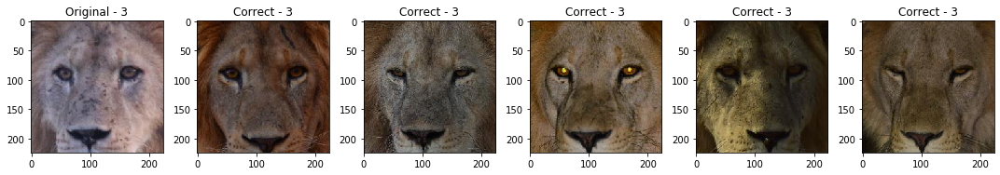

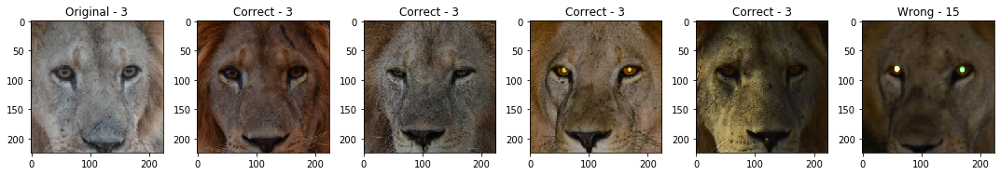

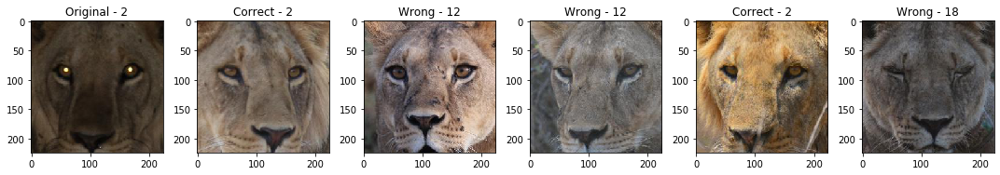

...

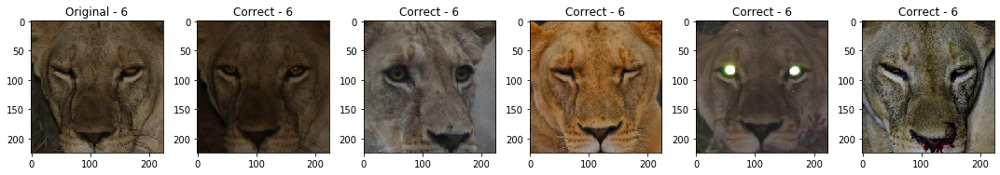

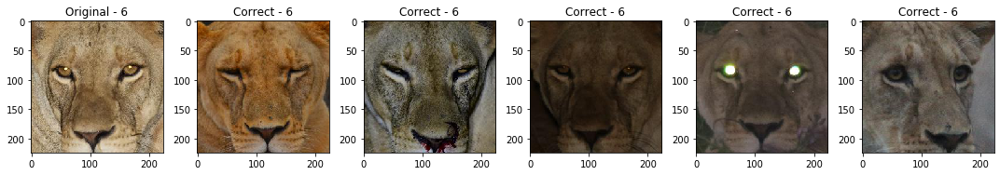

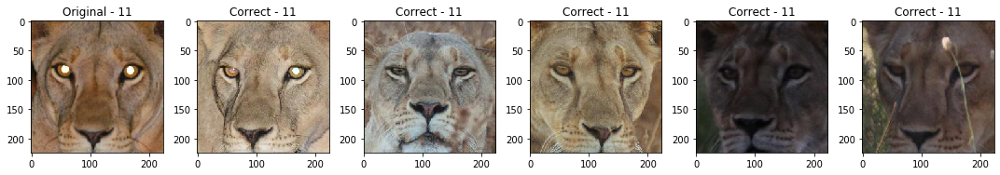

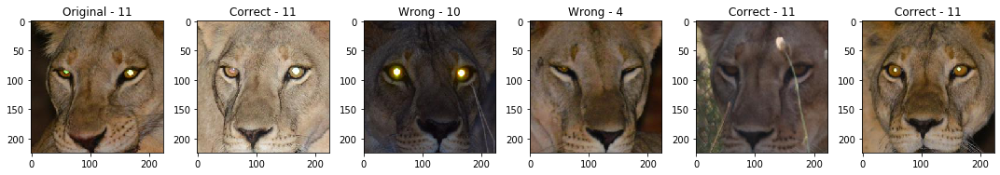

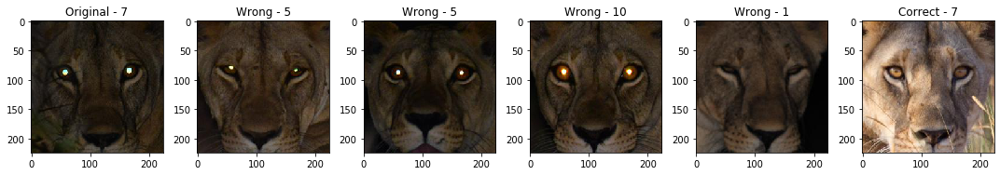

In [14]:
plot_most_similar(disk_data.valid_ds.x, inc_embeddings, disk_data.valid_ds.y.items, disk_data.train_ds.x, embeddings, disk_data.train_ds.y.items, 5)
